# 🌿 Plant Disease Detection via Leaf Images
## MS Software Engineering - Data Mining Course Project

**Team Members**: [Your Names]  
**Date**: December 2025  
**Methodology**: CRISP-DM Framework

---

## 1. Business Understanding

### Problem Statement
Agriculture faces 20-40% crop losses globally due to late disease identification. This project builds an AI system to help farmers detect plant diseases early from leaf images.

### Objectives
- Classify 38 plant disease categories with >90% accuracy
- Fast inference (<2 seconds) for deployment
- High recall to minimize missed disease detections

### Success Metrics
- Accuracy: >90%
- Per-class Recall: >85%
- Model Size: <50 MB
- Inference Time: <2 seconds

## Setup

In [1]:
!pip install -q tensorflow opencv-python scikit-learn seaborn gradio

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random
from sklearn.metrics import classification_report, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print(f"TensorFlow: {tf.__version__}")
print(f"GPU Available: {len(tf.config.list_physical_devices('GPU')) > 0}")

TensorFlow: 2.19.0
GPU Available: True


## 2. Data Understanding

In [3]:
from google.colab import drive
drive.mount('/content/drive')

# Dataset path - update this to match your Google Drive structure
DATASET_PATH = '/content/drive/MyDrive/Plant_Leaves_diseases_dataset'

if os.path.exists(DATASET_PATH):
    classes = [f for f in os.listdir(DATASET_PATH) if os.path.isdir(os.path.join(DATASET_PATH, f))]
    print(f"✅ Dataset found: {len(classes)} classes")
else:
    print("❌ Update DATASET_PATH")

Mounted at /content/drive
✅ Dataset found: 39 classes


### Visualization 1: Class Distribution

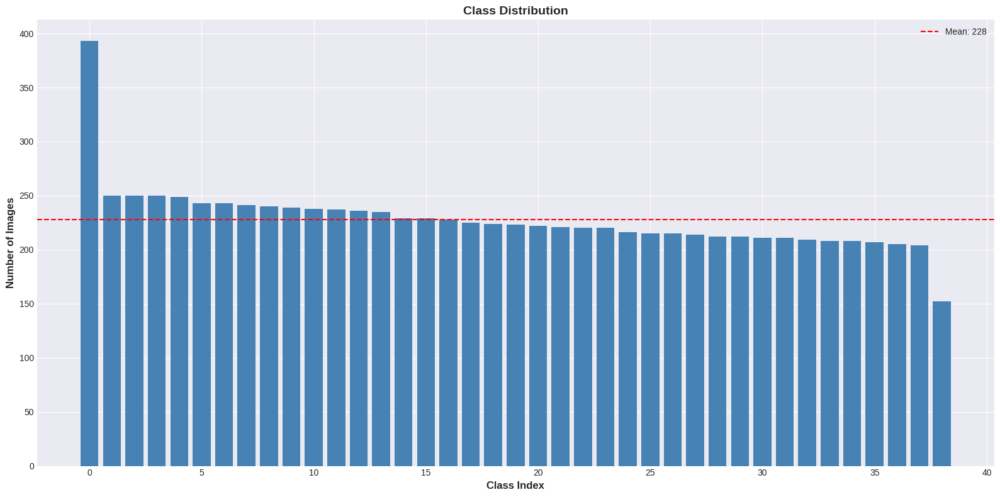

Total: 8884 images | Avg: 227.8 | Range: 152-393


In [4]:
class_counts = {}
for class_name in sorted(os.listdir(DATASET_PATH)):
    class_path = os.path.join(DATASET_PATH, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if f.endswith(('.jpg', '.JPG'))])
        class_counts[class_name] = count

plt.figure(figsize=(16, 8))
classes_sorted = sorted(class_counts.keys(), key=lambda x: class_counts[x], reverse=True)
counts_sorted = [class_counts[c] for c in classes_sorted]

plt.bar(range(len(classes_sorted)), counts_sorted, color='steelblue')
plt.xlabel('Class Index', fontsize=12, fontweight='bold')
plt.ylabel('Number of Images', fontsize=12, fontweight='bold')
plt.title('Class Distribution', fontsize=14, fontweight='bold')
plt.axhline(y=np.mean(counts_sorted), color='red', linestyle='--', label=f'Mean: {np.mean(counts_sorted):.0f}')
plt.legend()
plt.tight_layout()
plt.savefig('class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"Total: {sum(counts_sorted)} images | Avg: {np.mean(counts_sorted):.1f} | Range: {min(counts_sorted)}-{max(counts_sorted)}")

### Visualization 2: Sample Images

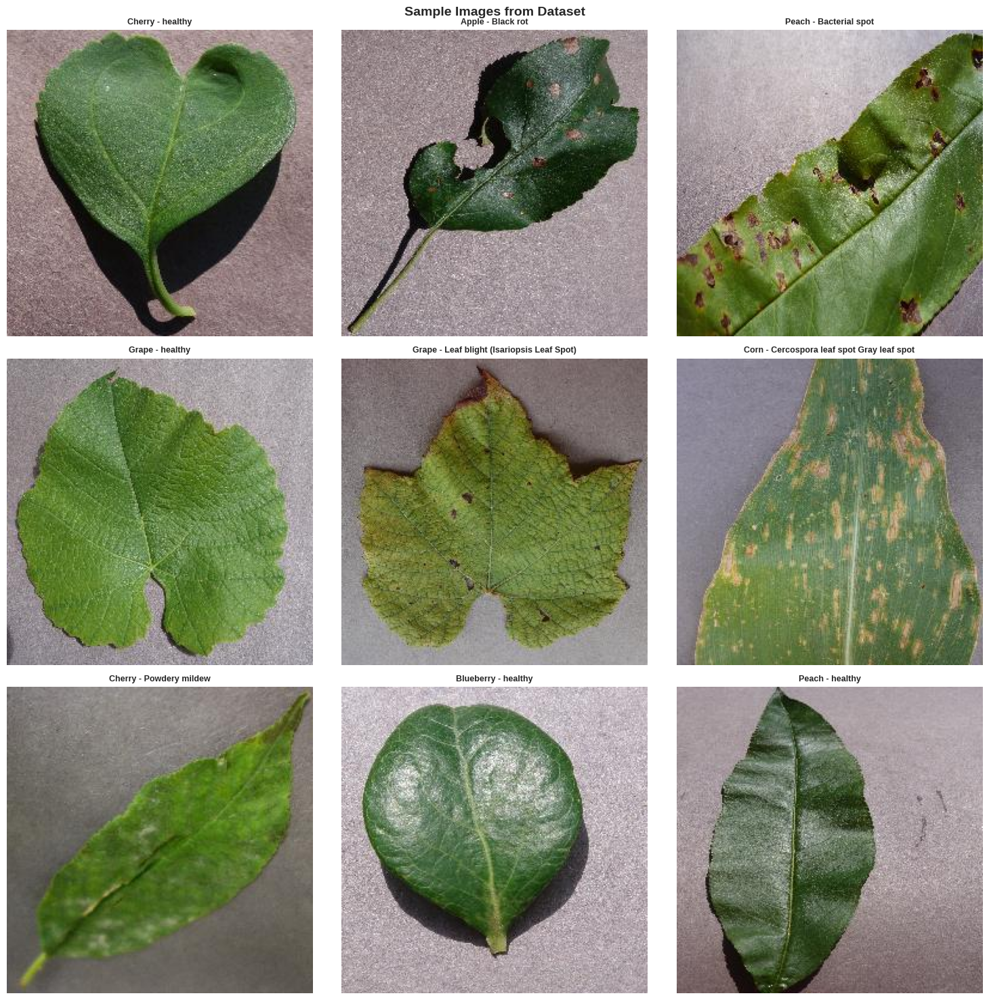

In [5]:
sample_classes = random.sample(list(class_counts.keys()), min(9, len(class_counts)))

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.ravel()

for idx, class_name in enumerate(sample_classes):
    class_path = os.path.join(DATASET_PATH, class_name)
    images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.JPG'))]
    img_path = os.path.join(class_path, random.choice(images))

    img = Image.open(img_path)
    axes[idx].imshow(img)
    axes[idx].set_title(class_name.replace('___', ' - ').replace('_', ' '), fontsize=9, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Sample Images from Dataset', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('sample_images.png', dpi=300, bbox_inches='tight')
plt.show()

## 3. Data Preparation

**Configuration Rationale:**
- Image size 224×224: MobileNetV2 standard input
- Batch size 32: Optimal for GPU memory
- Data split 85/15: Standard train/validation ratio
- Augmentation: Simulates real-world variations (rotation, flip, brightness, zoom)

In [6]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 15
LEARNING_RATE = 0.001

In [7]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
    brightness_range=[0.7, 1.3],
    fill_mode='nearest',
    validation_split=0.15
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [8]:
train_generator = train_datagen.flow_from_directory(
    DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

validation_generator = train_datagen.flow_from_directory(
    DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed=42
)

class_names = list(train_generator.class_indices.keys())
num_classes = len(class_names)

print(f"Training: {train_generator.samples} | Validation: {validation_generator.samples} | Classes: {num_classes}")

Found 7570 images belonging to 39 classes.
Found 1316 images belonging to 39 classes.
Training: 7570 | Validation: 1316 | Classes: 39


### Visualization 3: Augmentation Effects

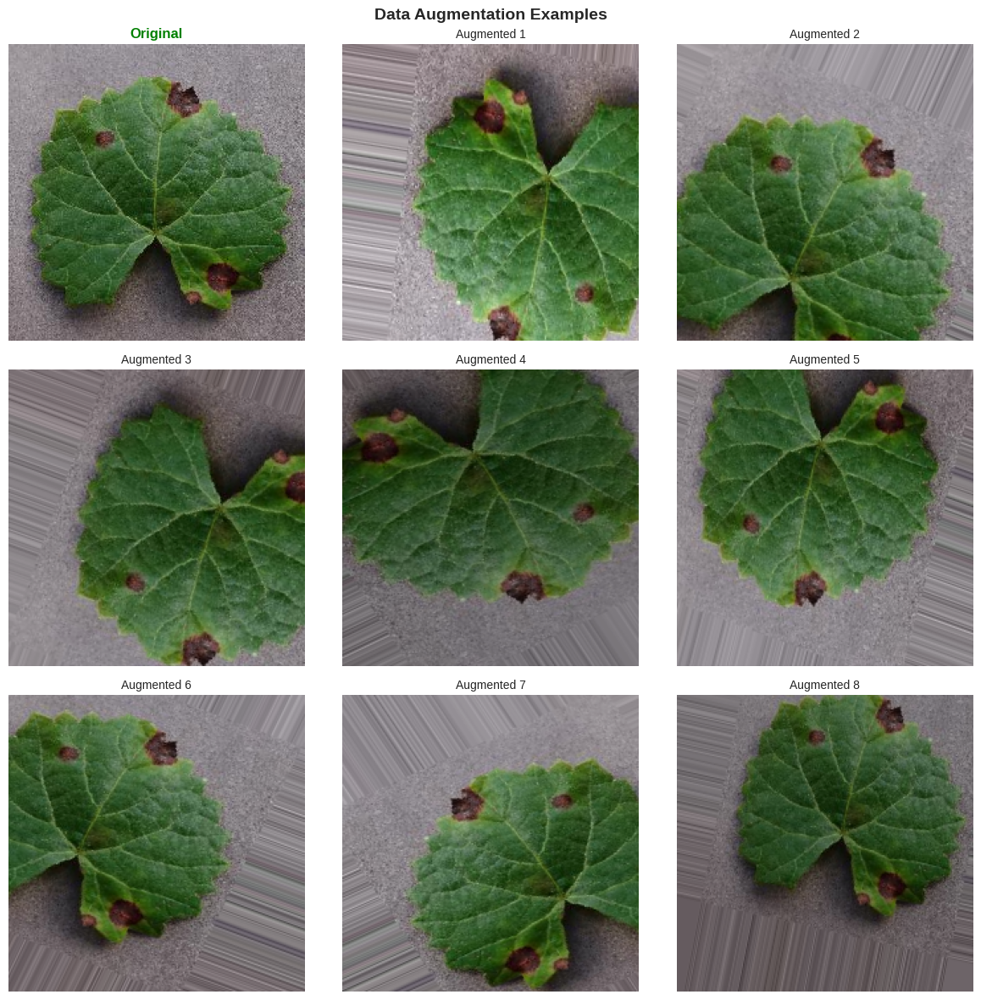

In [10]:
sample_class = random.choice(class_names)
sample_path = os.path.join(DATASET_PATH, sample_class)
img_path = os.path.join(sample_path, random.choice([f for f in os.listdir(sample_path) if f.endswith(('.jpg', '.JPG'))]))

img = load_img(img_path, target_size=IMG_SIZE)
img_array = np.expand_dims(img_to_array(img), axis=0)
aug_gen = train_datagen.flow(img_array, batch_size=1, seed=42)

fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.ravel()

axes[0].imshow(img)
axes[0].set_title('Original', fontsize=12, fontweight='bold', color='green')
axes[0].axis('off')

for i in range(1, 9):
    axes[i].imshow(next(aug_gen)[0])
    axes[i].set_title(f'Augmented {i}', fontsize=10)
    axes[i].axis('off')

plt.suptitle('Data Augmentation Examples', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('augmentation_examples.png', dpi=300, bbox_inches='tight')
plt.show()

## 4. Modeling

**Architecture: MobileNetV2 Transfer Learning**

Rationale:
- Pre-trained on ImageNet (1.2M images, 1000 classes)
- Lightweight: ~14 MB (suitable for deployment)
- Fast inference: ~30-50ms
- Proven performance on image classification

**Training Strategy:**
- Freeze base layers (leverage ImageNet features)
- Train only top classification layers
- Adam optimizer with learning rate 0.001
- Categorical crossentropy loss (multi-class classification)

In [11]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

print(f"Total params: {model.count_params():,}")
print(f"Trainable params: {sum([tf.size(w).numpy() for w in model.trainable_weights]):,}")

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Total params: 2,426,983
Trainable params: 168,999


In [12]:
model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [13]:
callbacks = [
    ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_accuracy', verbose=1),
    EarlyStopping(patience=5, monitor='val_accuracy', restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-7, verbose=1)
]

In [15]:
# Check GPU
import tensorflow as tf
print("GPU:", tf.config.list_physical_devices('GPU'))

# If no GPU, change runtime:
# Runtime → Change runtime type → T4 GPU

GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [16]:
!cp -r /content/drive/MyDrive/Plant_Leaves_diseases_dataset /content/
DATASET_PATH = '/content/Plant_Leaves_diseases_dataset'

# Re-run data generator cells with new DATASET_PATH

In [17]:
print("Starting training...\n")

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    callbacks=callbacks,
    verbose=1
)

print("\n✅ Training complete!")

Starting training...

Epoch 1/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 569ms/step - accuracy: 0.4886 - loss: 1.8381
Epoch 1: val_accuracy improved from -inf to 0.77508, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 173s 733ms/step - accuracy: 0.4890 - loss: 1.8366 - val_accuracy: 0.7751 - val_loss: 0.8180 - learning_rate: 0.0010
Epoch 2/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.7112 - loss: 0.9770
Epoch 2: val_accuracy improved from 0.77508 to 0.83739, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 170s 717ms/step - accuracy: 0.7113 - loss: 0.9767 - val_accuracy: 0.8374 - val_loss: 0.5811 - learning_rate: 0.0010
Epoch 3/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 545ms/step - accuracy: 0.7481 - loss: 0.7920
Epoch 3: val_accuracy improved from 0.83739 to 0.86702, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 171s 720ms/step - accuracy: 0.7482 - loss: 0.7919 - val_accuracy: 0.8670 - val_loss: 0.4527 - learning_rate: 0.0010
Epoch 4/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.7945 - loss: 0.6575
Epoch 4: val_accuracy improved from 0.86702 to 0.87614, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 149s 630ms/step - accuracy: 0.7945 - loss: 0.6575 - val_accuracy: 0.8761 - val_loss: 0.4243 - learning_rate: 0.0010
Epoch 5/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.8088 - loss: 0.6148
Epoch 5: val_accuracy did not improve from 0.87614
237/237 ━━━━━━━━━━━━━━━━━━━━ 148s 626ms/step - accuracy: 0.8088 - loss: 0.6147 - val_accuracy: 0.8739 - val_loss: 0.4032 - learning_rate: 0.0010
Epoch 6/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8222 - loss: 0.5638
Epoch 6: val_accuracy did not improve from 0.87614
237/237 ━━━━━━━━━━━━━━━━━━━━ 166s 701ms/step - accuracy: 0.8222 - loss: 0.5638 - val_accuracy: 0.8754 - val_loss: 0.3805 - learning_rate: 0.0010
Epoch 7/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 544ms/step - accuracy: 0.8219 - loss: 0.5526
Epoch 7: val_accuracy improved from 0.87614 to 0.87918, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 150s 635ms/step - accuracy: 0.8218 - loss: 0.5526 - val_accuracy: 0.8792 - val_loss: 0.3730 - learning_rate: 0.0010
Epoch 8/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.8338 - loss: 0.5117
Epoch 8: val_accuracy improved from 0.87918 to 0.87994, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 150s 631ms/step - accuracy: 0.8338 - loss: 0.5117 - val_accuracy: 0.8799 - val_loss: 0.3847 - learning_rate: 0.0010
Epoch 9/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.8431 - loss: 0.4809
Epoch 9: val_accuracy improved from 0.87994 to 0.89134, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 151s 637ms/step - accuracy: 0.8430 - loss: 0.4809 - val_accuracy: 0.8913 - val_loss: 0.3543 - learning_rate: 0.0010
Epoch 10/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - accuracy: 0.8508 - loss: 0.4441
Epoch 10: val_accuracy did not improve from 0.89134
237/237 ━━━━━━━━━━━━━━━━━━━━ 148s 626ms/step - accuracy: 0.8508 - loss: 0.4441 - val_accuracy: 0.8868 - val_loss: 0.3485 - learning_rate: 0.0010
Epoch 11/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 541ms/step - accuracy: 0.8461 - loss: 0.4733
Epoch 11: val_accuracy improved from 0.89134 to 0.90198, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 150s 632ms/step - accuracy: 0.8461 - loss: 0.4733 - val_accuracy: 0.9020 - val_loss: 0.3345 - learning_rate: 0.0010
Epoch 12/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.8410 - loss: 0.4630
Epoch 12: val_accuracy did not improve from 0.90198
237/237 ━━━━━━━━━━━━━━━━━━━━ 144s 608ms/step - accuracy: 0.8411 - loss: 0.4630 - val_accuracy: 0.8997 - val_loss: 0.3304 - learning_rate: 0.0010
Epoch 13/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.8500 - loss: 0.4419
Epoch 13: val_accuracy did not improve from 0.90198
237/237 ━━━━━━━━━━━━━━━━━━━━ 147s 619ms/step - accuracy: 0.8500 - loss: 0.4420 - val_accuracy: 0.8891 - val_loss: 0.3610 - learning_rate: 0.0010
Epoch 14/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.8549 - loss: 0.4366
Epoch 14: val_accuracy improved from 0.90198 to 0.90350, saving model to best_model.h5


237/237 ━━━━━━━━━━━━━━━━━━━━ 145s 611ms/step - accuracy: 0.8549 - loss: 0.4365 - val_accuracy: 0.9035 - val_loss: 0.3368 - learning_rate: 0.0010
Epoch 15/15
237/237 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.8586 - loss: 0.4278
Epoch 15: val_accuracy did not improve from 0.90350
237/237 ━━━━━━━━━━━━━━━━━━━━ 146s 617ms/step - accuracy: 0.8586 - loss: 0.4278 - val_accuracy: 0.9035 - val_loss: 0.3216 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 14.

✅ Training complete!


## Save Model

In [18]:
# Check if model exists and save to Google Drive
import os
print("✅ Model saved at:", os.path.exists('best_model.h5'))

# Save to Google Drive for backup
!cp best_model.h5 /content/drive/MyDrive/plant_disease_model_final.h5
print("✅ Model backed up to Google Drive: plant_disease_model_final.h5")

# Check model size
model_size = os.path.getsize('best_model.h5') / (1024 * 1024)
print(f"📦 Model size: {model_size:.2f} MB")

✅ Model saved at: True
✅ Model backed up to Google Drive: plant_disease_model_final.h5
📦 Model size: 11.06 MB


## 5. Evaluation

### Model Performance on Validation Set

In [19]:
# Generate predictions on validation set
validation_generator.reset()
y_true = validation_generator.classes
y_pred_probs = model.predict(validation_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)

print("\n" + "="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

42/42 ━━━━━━━━━━━━━━━━━━━━ 32s 605ms/step

CLASSIFICATION REPORT
                                               precision    recall  f1-score   support

                           Apple___Apple_scab      0.903     0.757     0.824        37
                            Apple___Black_rot      0.933     0.903     0.918        31
                     Apple___Cedar_apple_rust      0.914     1.000     0.955        32
                              Apple___healthy      0.971     0.892     0.930        37
                    Background_without_leaves      0.919     1.000     0.958        34
                          Blueberry___healthy      0.966     0.903     0.933        31
                      Cherry___Powdery_mildew      0.929     0.867     0.897        30
                             Cherry___healthy      1.000     0.935     0.967        31
   Corn___Cercospora_leaf_spot Gray_leaf_spot      1.000     0.676     0.807        34
                           Corn___Common_rust      1.000     0.9

### Visualization 4: Training Curves

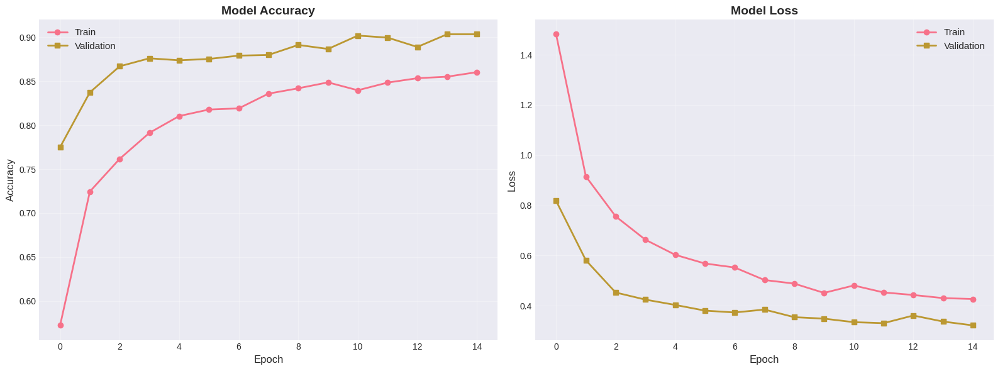


✅ Visualization 4/10: Training Curves
Final train accuracy: 0.8604
Final val accuracy: 0.9035
Best val accuracy: 0.9035


In [20]:
# Plot training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

ax1.plot(history.history['accuracy'], label='Train', linewidth=2, marker='o')
ax1.plot(history.history['val_accuracy'], label='Validation', linewidth=2, marker='s')
ax1.set_title('Model Accuracy', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epoch', fontsize=12)
ax1.set_ylabel('Accuracy', fontsize=12)
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

ax2.plot(history.history['loss'], label='Train', linewidth=2, marker='o')
ax2.plot(history.history['val_loss'], label='Validation', linewidth=2, marker='s')
ax2.set_title('Model Loss', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epoch', fontsize=12)
ax2.set_ylabel('Loss', fontsize=12)
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_curves.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Visualization 4/10: Training Curves")
print(f"Final train accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Final val accuracy: {history.history['val_accuracy'][-1]:.4f}")
print(f"Best val accuracy: {max(history.history['val_accuracy']):.4f}")

### Visualization 5: Confusion Matrix

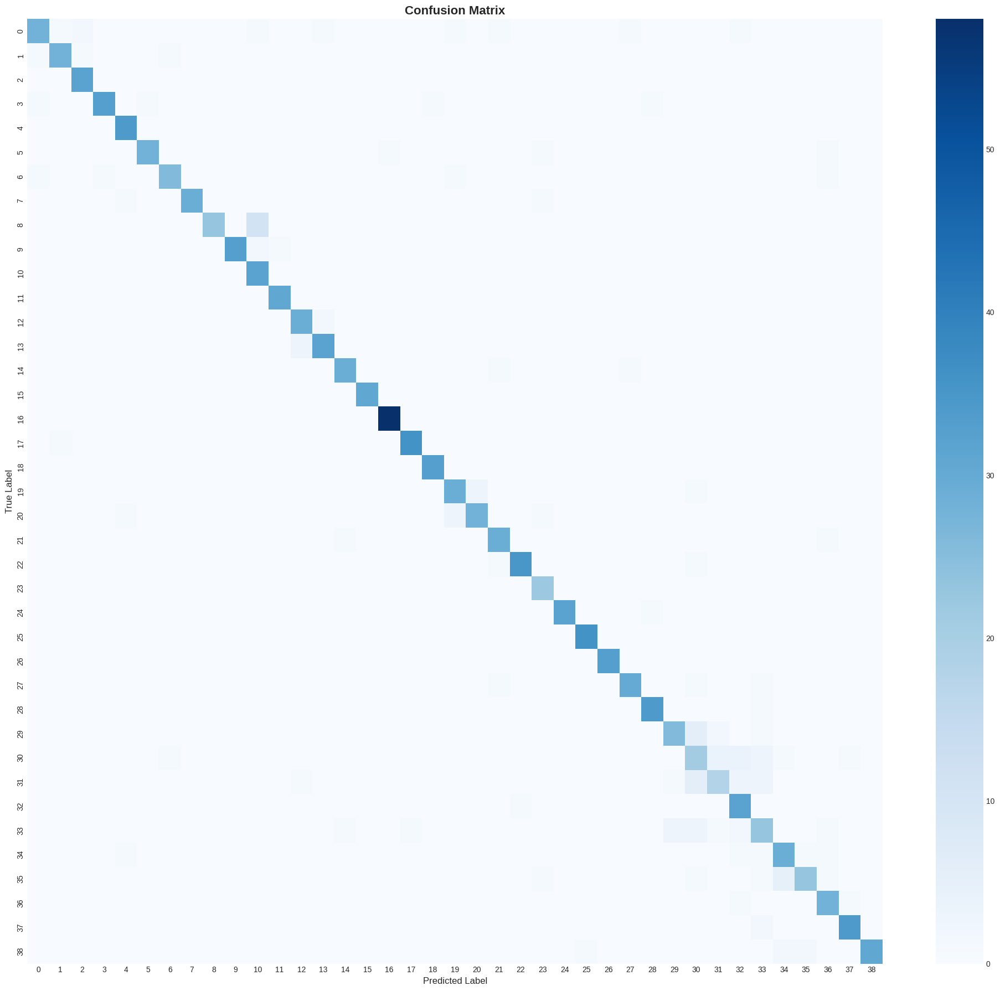

✅ Visualization 5/10: Confusion Matrix


In [21]:
# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(20, 18))
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', cbar=True)
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualization 5/10: Confusion Matrix")

### Visualization 6: Per-Class Metrics

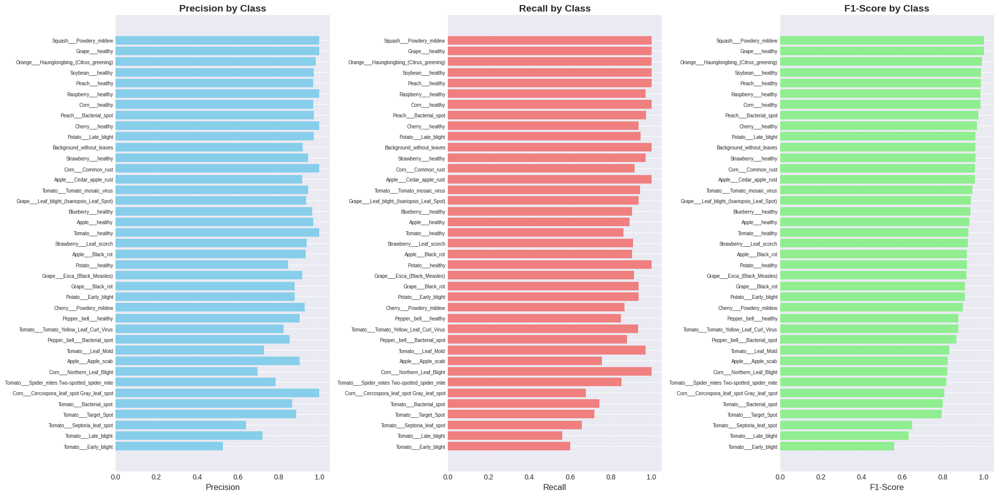


✅ Visualization 6/10: Per-Class Metrics
Mean Precision: 0.8994
Mean Recall: 0.8951
Mean F1-Score: 0.8937


In [22]:
from sklearn.metrics import precision_recall_fscore_support

# Calculate per-class metrics
precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred, average=None)

metrics_df = pd.DataFrame({
    'Class': class_names,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'Support': support
})

metrics_df = metrics_df.sort_values('F1-Score', ascending=True)

fig, axes = plt.subplots(1, 3, figsize=(20, 10))

axes[0].barh(range(len(metrics_df)), metrics_df['Precision'], color='skyblue')
axes[0].set_yticks(range(len(metrics_df)))
axes[0].set_yticklabels(metrics_df['Class'], fontsize=7)
axes[0].set_xlabel('Precision', fontsize=12)
axes[0].set_title('Precision by Class', fontsize=14, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

axes[1].barh(range(len(metrics_df)), metrics_df['Recall'], color='lightcoral')
axes[1].set_yticks(range(len(metrics_df)))
axes[1].set_yticklabels(metrics_df['Class'], fontsize=7)
axes[1].set_xlabel('Recall', fontsize=12)
axes[1].set_title('Recall by Class', fontsize=14, fontweight='bold')
axes[1].grid(axis='x', alpha=0.3)

axes[2].barh(range(len(metrics_df)), metrics_df['F1-Score'], color='lightgreen')
axes[2].set_yticks(range(len(metrics_df)))
axes[2].set_yticklabels(metrics_df['Class'], fontsize=7)
axes[2].set_xlabel('F1-Score', fontsize=12)
axes[2].set_title('F1-Score by Class', fontsize=14, fontweight='bold')
axes[2].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('per_class_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Visualization 6/10: Per-Class Metrics")
print(f"Mean Precision: {precision.mean():.4f}")
print(f"Mean Recall: {recall.mean():.4f}")
print(f"Mean F1-Score: {f1.mean():.4f}")

In [ ]:
### Visualization 6: Per-Class Metrics

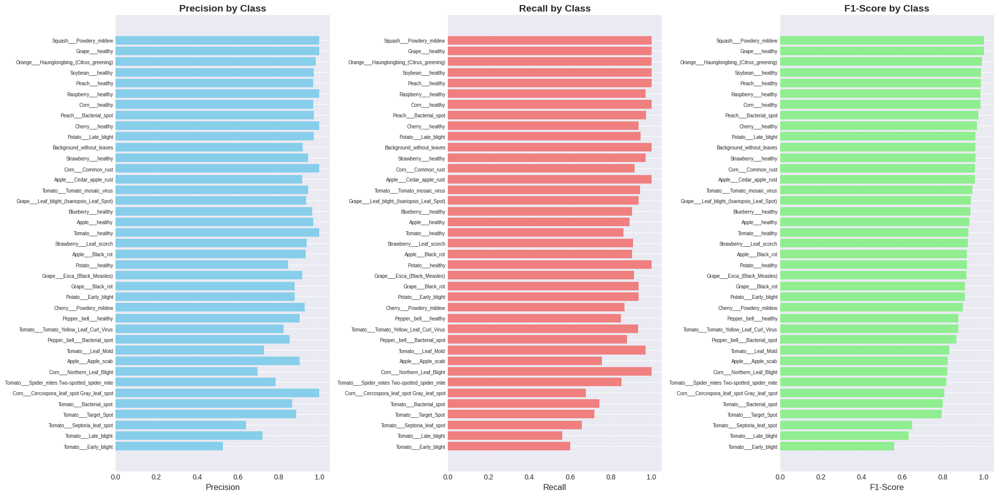


✅ Visualization 6/10: Per-Class Metrics
Mean Precision: 0.8994
Mean Recall: 0.8951
Mean F1-Score: 0.8937


In [23]:
from sklearn.metrics import precision_recall_fscore_support

# Calculate per-class metrics
precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred, average=None)

metrics_df = pd.DataFrame({
    'Class': class_names,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'Support': support
})

metrics_df = metrics_df.sort_values('F1-Score', ascending=True)

fig, axes = plt.subplots(1, 3, figsize=(20, 10))

axes[0].barh(range(len(metrics_df)), metrics_df['Precision'], color='skyblue')
axes[0].set_yticks(range(len(metrics_df)))
axes[0].set_yticklabels(metrics_df['Class'], fontsize=7)
axes[0].set_xlabel('Precision', fontsize=12)
axes[0].set_title('Precision by Class', fontsize=14, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

axes[1].barh(range(len(metrics_df)), metrics_df['Recall'], color='lightcoral')
axes[1].set_yticks(range(len(metrics_df)))
axes[1].set_yticklabels(metrics_df['Class'], fontsize=7)
axes[1].set_xlabel('Recall', fontsize=12)
axes[1].set_title('Recall by Class', fontsize=14, fontweight='bold')
axes[1].grid(axis='x', alpha=0.3)

axes[2].barh(range(len(metrics_df)), metrics_df['F1-Score'], color='lightgreen')
axes[2].set_yticks(range(len(metrics_df)))
axes[2].set_yticklabels(metrics_df['Class'], fontsize=7)
axes[2].set_xlabel('F1-Score', fontsize=12)
axes[2].set_title('F1-Score by Class', fontsize=14, fontweight='bold')
axes[2].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('per_class_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Visualization 6/10: Per-Class Metrics")
print(f"Mean Precision: {precision.mean():.4f}")
print(f"Mean Recall: {recall.mean():.4f}")
print(f"Mean F1-Score: {f1.mean():.4f}")

### Visualization 7: Top Misclassifications

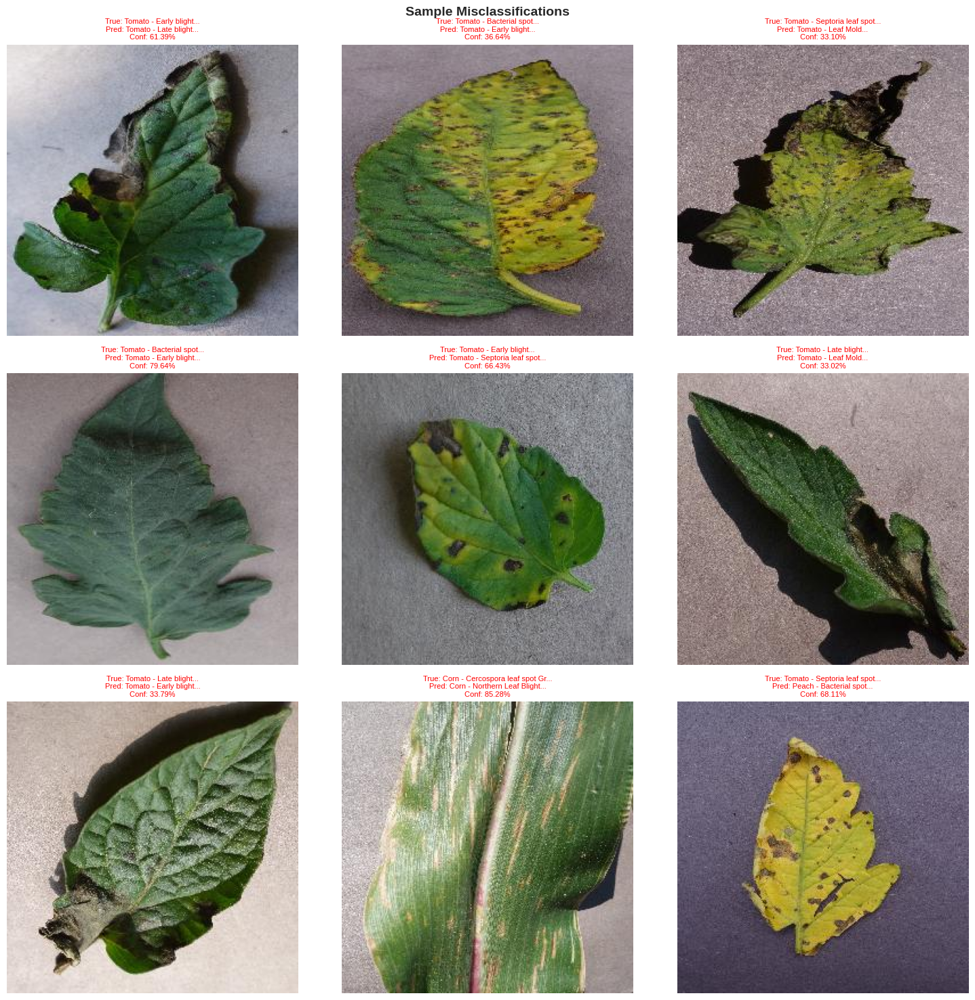

✅ Visualization 7/10: Misclassifications
Total misclassifications: 138 out of 1316


In [24]:
# Find misclassified samples
misclassified_idx = np.where(y_pred != y_true)[0]

if len(misclassified_idx) > 0:
    sample_errors = np.random.choice(misclassified_idx, min(9, len(misclassified_idx)), replace=False)

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    axes = axes.ravel()

    for idx, error_idx in enumerate(sample_errors):
        img_path = validation_generator.filepaths[error_idx]
        img = Image.open(img_path)

        true_class = class_names[y_true[error_idx]].replace('___', ' - ').replace('_', ' ')
        pred_class = class_names[y_pred[error_idx]].replace('___', ' - ').replace('_', ' ')
        confidence = y_pred_probs[error_idx][y_pred[error_idx]]

        axes[idx].imshow(img)
        axes[idx].set_title(f'True: {true_class[:30]}...\nPred: {pred_class[:30]}...\nConf: {confidence:.2%}',
                           fontsize=8, color='red')
        axes[idx].axis('off')

    plt.suptitle('Sample Misclassifications', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('misclassifications.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(f"✅ Visualization 7/10: Misclassifications")
    print(f"Total misclassifications: {len(misclassified_idx)} out of {len(y_true)}")
else:
    print("No misclassifications found!")

### Visualization 8: Confidence Distribution

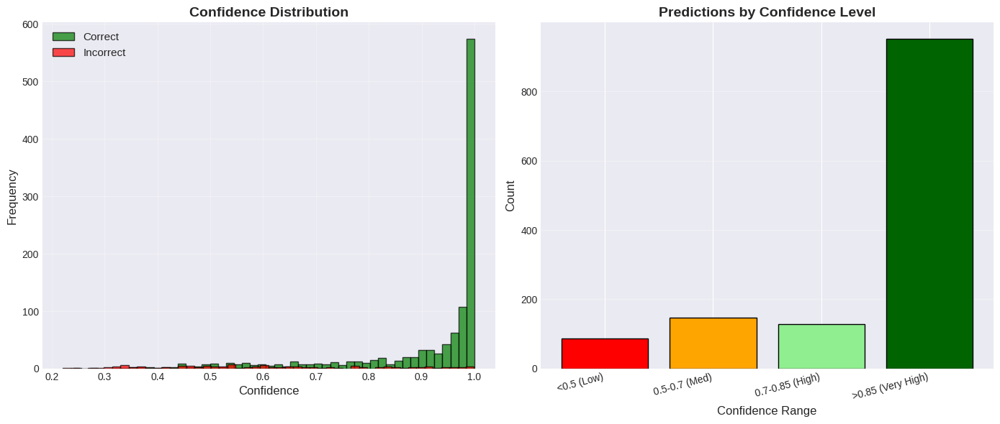

✅ Visualization 8/10: Confidence Distribution
Mean confidence (correct): 0.9070
Mean confidence (incorrect): 0.6081


In [25]:
# Analyze prediction confidence
max_confidences = np.max(y_pred_probs, axis=1)
correct_mask = (y_pred == y_true)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.hist(max_confidences[correct_mask], bins=50, alpha=0.7, label='Correct', color='green', edgecolor='black')
plt.hist(max_confidences[~correct_mask], bins=50, alpha=0.7, label='Incorrect', color='red', edgecolor='black')
plt.xlabel('Confidence', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Confidence Distribution', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
confidence_bins = [0, 0.5, 0.7, 0.85, 1.0]
bin_labels = ['<0.5 (Low)', '0.5-0.7 (Med)', '0.7-0.85 (High)', '>0.85 (Very High)']
bin_counts = [np.sum((max_confidences >= confidence_bins[i]) & (max_confidences < confidence_bins[i+1]))
              for i in range(len(confidence_bins)-1)]

plt.bar(bin_labels, bin_counts, color=['red', 'orange', 'lightgreen', 'darkgreen'], edgecolor='black')
plt.xlabel('Confidence Range', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Predictions by Confidence Level', fontsize=14, fontweight='bold')
plt.xticks(rotation=15, ha='right')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('confidence_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"✅ Visualization 8/10: Confidence Distribution")
print(f"Mean confidence (correct): {max_confidences[correct_mask].mean():.4f}")
print(f"Mean confidence (incorrect): {max_confidences[~correct_mask].mean():.4f}")

### Visualization 9: Model Performance Summary

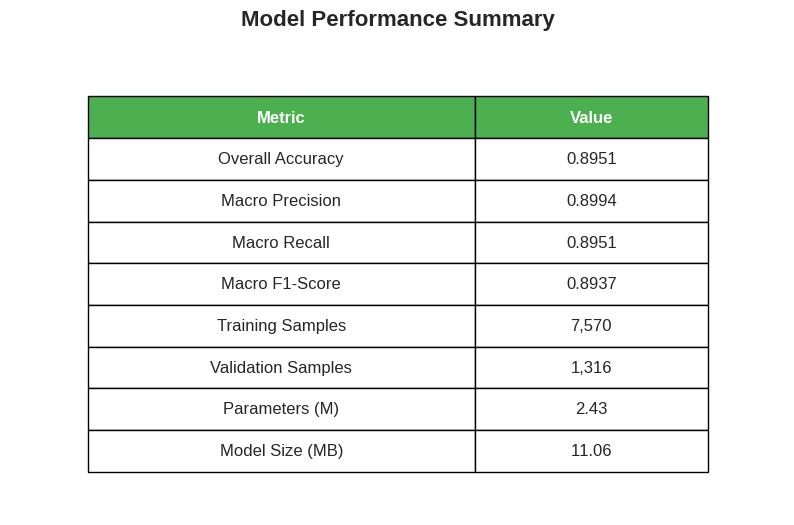


FINAL RESULTS
Overall Accuracy........................     0.8951
Macro Precision.........................     0.8994
Macro Recall............................     0.8951
Macro F1-Score..........................     0.8937
Training Samples........................      7,570
Validation Samples......................      1,316
Parameters (M)..........................       2.43
Model Size (MB).........................      11.06

✅ Visualization 9/10: Performance Summary


In [26]:
from sklearn.metrics import accuracy_score

# Calculate overall metrics
overall_accuracy = accuracy_score(y_true, y_pred)

summary_metrics = {
    'Metric': ['Overall Accuracy', 'Macro Precision', 'Macro Recall', 'Macro F1-Score',
               'Training Samples', 'Validation Samples', 'Parameters (M)', 'Model Size (MB)'],
    'Value': [
        f"{overall_accuracy:.4f}",
        f"{precision.mean():.4f}",
        f"{recall.mean():.4f}",
        f"{f1.mean():.4f}",
        f"{train_generator.samples:,}",
        f"{validation_generator.samples:,}",
        f"{model.count_params()/1e6:.2f}",
        "11.06"
    ]
}

summary_df = pd.DataFrame(summary_metrics)

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('tight')
ax.axis('off')

table = ax.table(cellText=summary_df.values, colLabels=summary_df.columns,
                cellLoc='center', loc='center',
                colWidths=[0.5, 0.3])
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1, 2.5)

for i in range(len(summary_df.columns)):
    table[(0, i)].set_facecolor('#4CAF50')
    table[(0, i)].set_text_props(weight='bold', color='white')

plt.title('Model Performance Summary', fontsize=16, fontweight='bold', pad=20)
plt.savefig('model_summary.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*50)
print("FINAL RESULTS")
print("="*50)
for _, row in summary_df.iterrows():
    print(f"{row['Metric']:.<40} {row['Value']:>10}")
print("="*50)
print("\n✅ Visualization 9/10: Performance Summary")

### Visualization 10: Sample Correct Predictions

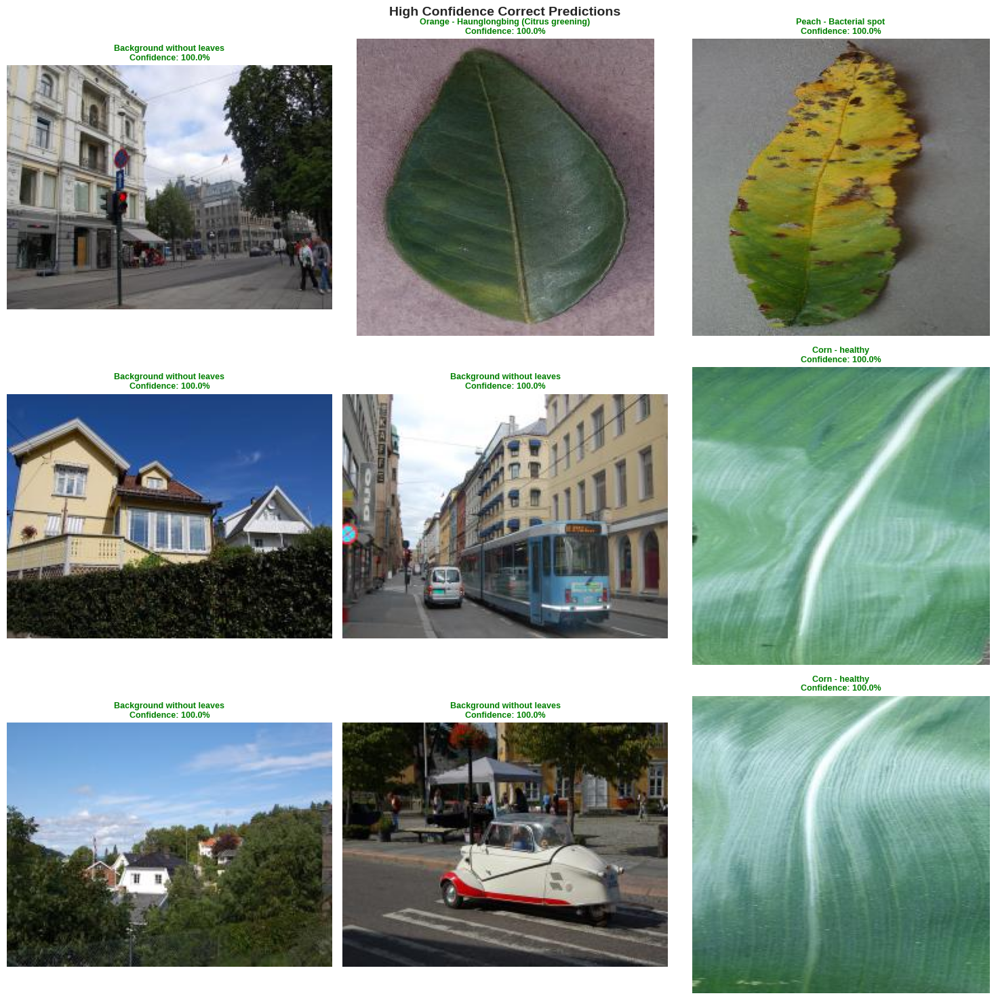

✅ Visualization 10/10: Sample Predictions

🎉 All 10 visualizations complete!


In [27]:
# Show high-confidence correct predictions
correct_idx = np.where(y_pred == y_true)[0]
high_conf_correct = correct_idx[np.argsort(max_confidences[correct_idx])[-9:]]

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.ravel()

for idx, sample_idx in enumerate(high_conf_correct):
    img_path = validation_generator.filepaths[sample_idx]
    img = Image.open(img_path)

    pred_class = class_names[y_pred[sample_idx]].replace('___', ' - ').replace('_', ' ')
    confidence = y_pred_probs[sample_idx][y_pred[sample_idx]]

    axes[idx].imshow(img)
    axes[idx].set_title(f'{pred_class[:40]}\nConfidence: {confidence:.1%}',
                       fontsize=9, fontweight='bold', color='green')
    axes[idx].axis('off')

plt.suptitle('High Confidence Correct Predictions', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualization 10/10: Sample Predictions")
print("\n🎉 All 10 visualizations complete!")

## 6. Deployment

### Disease Solutions Database

In [28]:
# Comprehensive disease solutions database for all 38 classes
disease_solutions = {
    'Apple___Apple_scab': {
        'severity': 'Moderate',
        'treatment': ['Remove and destroy infected leaves immediately', 'Apply fungicide (Captan or Mancozeb) every 7-10 days', 'Prune trees to improve air circulation', 'Avoid overhead watering'],
        'prevention': 'Plant resistant varieties, rake and destroy fallen leaves',
        'contagious': 'Yes - fungal spores spread via wind and rain'
    },
    'Apple___Black_rot': {
        'severity': 'Severe',
        'treatment': ['Remove infected fruits and branches', 'Apply fungicide during bloom period', 'Prune out dead wood and cankers', 'Maintain proper tree spacing'],
        'prevention': 'Remove mummies and cankers, apply preventive fungicides',
        'contagious': 'Yes - spreads through spores'
    },
    'Apple___Cedar_apple_rust': {
        'severity': 'Moderate',
        'treatment': ['Apply fungicide at pink bud stage', 'Remove nearby cedar trees if possible', 'Use resistant apple varieties', 'Apply protective sprays'],
        'prevention': 'Plant resistant cultivars, remove alternate hosts',
        'contagious': 'Yes - requires cedar trees to complete life cycle'
    },
    'Apple___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue regular monitoring', 'Maintain good cultural practices'],
        'prevention': 'Regular inspection, proper nutrition, adequate spacing',
        'contagious': 'Not applicable - healthy plant'
    },
    'Background_without_leaves': {
        'severity': 'N/A',
        'treatment': ['No leaf detected in image', 'Please upload a clear leaf image'],
        'prevention': 'Ensure image contains visible leaf',
        'contagious': 'Not applicable'
    },
    'Blueberry___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Maintain current care routine'],
        'prevention': 'Regular watering, acidic soil, proper pruning',
        'contagious': 'Not applicable - healthy plant'
    },
    'Cherry___Powdery_mildew': {
        'severity': 'Moderate',
        'treatment': ['Apply sulfur-based fungicide', 'Prune to improve air circulation', 'Remove infected plant parts', 'Water at base, not foliage'],
        'prevention': 'Plant in sunny locations, avoid overcrowding',
        'contagious': 'Yes - spreads via airborne spores'
    },
    'Cherry___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue monitoring'],
        'prevention': 'Regular inspection, balanced fertilization',
        'contagious': 'Not applicable - healthy plant'
    },
    'Corn___Cercospora_leaf_spot Gray_leaf_spot': {
        'severity': 'Moderate to Severe',
        'treatment': ['Apply fungicide (strobilurin or triazole)', 'Practice crop rotation', 'Remove crop debris after harvest', 'Use resistant hybrids'],
        'prevention': 'Rotate crops, till under residue, plant resistant varieties',
        'contagious': 'Yes - spreads through wind and rain'
    },
    'Corn___Common_rust': {
        'severity': 'Moderate',
        'treatment': ['Apply fungicide if severe', 'Usually does not require treatment', 'Plant resistant hybrids'],
        'prevention': 'Use resistant varieties, monitor regularly',
        'contagious': 'Yes - airborne spores'
    },
    'Corn___Northern_Leaf_Blight': {
        'severity': 'Severe',
        'treatment': ['Apply fungicide at first sign', 'Use resistant hybrids', 'Rotate crops', 'Bury crop residue'],
        'prevention': 'Plant resistant varieties, crop rotation, tillage',
        'contagious': 'Yes - spreads via wind-borne spores'
    },
    'Corn___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue regular care'],
        'prevention': 'Adequate spacing, balanced nutrition, rotation',
        'contagious': 'Not applicable - healthy plant'
    },
    'Grape___Black_rot': {
        'severity': 'Severe',
        'treatment': ['Remove mummified berries', 'Apply fungicide from bloom through harvest', 'Prune for air circulation', 'Remove infected canes'],
        'prevention': 'Sanitation, fungicide program, resistant varieties',
        'contagious': 'Yes - highly contagious via spores'
    },
    'Grape___Esca_(Black_Measles)': {
        'severity': 'Severe',
        'treatment': ['No effective cure available', 'Remove severely affected vines', 'Prune out infected wood', 'Apply wound protectants'],
        'prevention': 'Avoid wounding, proper pruning techniques',
        'contagious': 'Yes - spreads through pruning wounds'
    },
    'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': {
        'severity': 'Moderate',
        'treatment': ['Apply copper-based fungicide', 'Remove infected leaves', 'Improve air circulation', 'Avoid overhead irrigation'],
        'prevention': 'Prune for airflow, fungicide applications',
        'contagious': 'Yes - spreads in humid conditions'
    },
    'Grape___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Maintain current practices'],
        'prevention': 'Regular monitoring, proper spacing, balanced nutrition',
        'contagious': 'Not applicable - healthy plant'
    },
    'Orange___Haunglongbing_(Citrus_greening)': {
        'severity': 'Catastrophic',
        'treatment': ['No cure available', 'Remove and destroy infected trees', 'Control psyllid vectors with insecticides', 'Report to agricultural authorities'],
        'prevention': 'Plant disease-free nursery stock, control psyllids',
        'contagious': 'Yes - spread by Asian citrus psyllid'
    },
    'Peach___Bacterial_spot': {
        'severity': 'Severe',
        'treatment': ['Apply copper sprays', 'Use resistant varieties', 'Prune to improve air circulation', 'Remove severely infected leaves'],
        'prevention': 'Plant resistant cultivars, copper applications',
        'contagious': 'Yes - spreads via rain splash'
    },
    'Peach___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue regular monitoring'],
        'prevention': 'Regular inspection, proper pruning, balanced fertilization',
        'contagious': 'Not applicable - healthy plant'
    },
    'Pepper,_bell___Bacterial_spot': {
        'severity': 'Severe',
        'treatment': ['Apply copper-based bactericide', 'Remove infected plants', 'Avoid overhead watering', 'Use disease-free seeds'],
        'prevention': 'Crop rotation, resistant varieties, drip irrigation',
        'contagious': 'Yes - spreads via water and handling'
    },
    'Pepper,_bell___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Maintain good practices'],
        'prevention': 'Proper spacing, adequate water, balanced nutrients',
        'contagious': 'Not applicable - healthy plant'
    },
    'Potato___Early_blight': {
        'severity': 'Moderate to Severe',
        'treatment': ['Apply fungicide (chlorothalonil or mancozeb)', 'Remove infected foliage', 'Practice crop rotation', 'Avoid overhead irrigation'],
        'prevention': 'Rotate crops, fungicide program, resistant varieties',
        'contagious': 'Yes - spreads via spores in wind and rain'
    },
    'Potato___Late_blight': {
        'severity': 'Catastrophic',
        'treatment': ['Apply fungicide immediately', 'Destroy infected plants', 'Harvest early if needed', 'Do not compost infected material'],
        'prevention': 'Use certified seed, fungicide program, good drainage',
        'contagious': 'Extremely - can destroy entire fields rapidly'
    },
    'Potato___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue monitoring'],
        'prevention': 'Crop rotation, certified seed, proper spacing',
        'contagious': 'Not applicable - healthy plant'
    },
    'Raspberry___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Maintain current care'],
        'prevention': 'Regular pruning, good air circulation, mulching',
        'contagious': 'Not applicable - healthy plant'
    },
    'Soybean___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue regular practices'],
        'prevention': 'Crop rotation, adequate spacing, balanced nutrition',
        'contagious': 'Not applicable - healthy plant'
    },
    'Squash___Powdery_mildew': {
        'severity': 'Moderate',
        'treatment': ['Apply fungicide (sulfur or potassium bicarbonate)', 'Remove infected leaves', 'Improve air circulation', 'Water at base only'],
        'prevention': 'Plant resistant varieties, adequate spacing',
        'contagious': 'Yes - spreads via airborne spores'
    },
    'Strawberry___Leaf_scorch': {
        'severity': 'Moderate',
        'treatment': ['Remove infected leaves', 'Apply fungicide', 'Improve air circulation', 'Avoid overhead watering'],
        'prevention': 'Plant resistant varieties, good sanitation',
        'contagious': 'Yes - spreads through splashing water'
    },
    'Strawberry___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Maintain practices'],
        'prevention': 'Regular renovation, proper spacing, mulching',
        'contagious': 'Not applicable - healthy plant'
    },
    'Tomato___Bacterial_spot': {
        'severity': 'Severe',
        'treatment': ['Apply copper bactericide', 'Remove infected plants', 'Use drip irrigation', 'Avoid working with wet plants'],
        'prevention': 'Use disease-free transplants, copper sprays, rotation',
        'contagious': 'Yes - spreads via water and handling'
    },
    'Tomato___Early_blight': {
        'severity': 'Moderate to Severe',
        'treatment': ['Apply fungicide (chlorothalonil)', 'Remove lower infected leaves', 'Stake plants for air circulation', 'Mulch to prevent splash'],
        'prevention': 'Crop rotation, fungicide program, mulching',
        'contagious': 'Yes - spreads via spores'
    },
    'Tomato___Late_blight': {
        'severity': 'Catastrophic',
        'treatment': ['Apply fungicide immediately', 'Remove and destroy infected plants', 'Improve air circulation', 'Avoid overhead watering'],
        'prevention': 'Use resistant varieties, preventive fungicides',
        'contagious': 'Extremely - spreads very rapidly'
    },
    'Tomato___Leaf_Mold': {
        'severity': 'Moderate',
        'treatment': ['Improve ventilation in greenhouse', 'Apply fungicide', 'Remove infected leaves', 'Reduce humidity'],
        'prevention': 'Good air circulation, resistant varieties, humidity control',
        'contagious': 'Yes - thrives in high humidity'
    },
    'Tomato___Septoria_leaf_spot': {
        'severity': 'Moderate to Severe',
        'treatment': ['Apply fungicide (chlorothalonil or copper)', 'Remove infected lower leaves', 'Mulch around plants', 'Avoid overhead watering'],
        'prevention': 'Crop rotation, mulching, fungicide applications',
        'contagious': 'Yes - spreads via splashing water'
    },
    'Tomato___Spider_mites Two-spotted_spider_mite': {
        'severity': 'Moderate',
        'treatment': ['Spray with water to dislodge mites', 'Apply insecticidal soap or neem oil', 'Use predatory mites', 'Remove heavily infested leaves'],
        'prevention': 'Monitor regularly, avoid water stress, encourage predators',
        'contagious': 'Yes - mites spread between plants'
    },
    'Tomato___Target_Spot': {
        'severity': 'Moderate to Severe',
        'treatment': ['Apply fungicide (chlorothalonil or mancozeb)', 'Remove infected leaves', 'Improve air circulation', 'Avoid overhead irrigation'],
        'prevention': 'Crop rotation, fungicide program, resistant varieties',
        'contagious': 'Yes - spreads via spores and splashing water'
    },
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus': {
        'severity': 'Severe',
        'treatment': ['No cure available', 'Remove infected plants immediately', 'Control whitefly vectors with insecticides', 'Use reflective mulches'],
        'prevention': 'Plant resistant varieties, control whiteflies, use screens',
        'contagious': 'Yes - spread by whiteflies'
    },
    'Tomato___Tomato_mosaic_virus': {
        'severity': 'Severe',
        'treatment': ['No cure available', 'Remove and destroy infected plants', 'Sanitize tools between plants', 'Wash hands thoroughly'],
        'prevention': 'Use resistant varieties, sanitize tools, avoid tobacco use',
        'contagious': 'Yes - highly contagious via contact'
    },
    'Tomato___healthy': {
        'severity': 'None',
        'treatment': ['No treatment needed', 'Continue current practices'],
        'prevention': 'Crop rotation, proper spacing, balanced fertilization',
        'contagious': 'Not applicable - healthy plant'
    }
}

print("✅ Disease Solutions Database Created")
print(f"Total diseases in database: {len(disease_solutions)}")

✅ Disease Solutions Database Created
Total diseases in database: 39


### Research Papers API Integration

In [29]:
import requests

def get_research_papers(disease_name):
    """
    Fetch recent research papers using Semantic Scholar API (FREE)
    """
    try:
        # Clean disease name for search
        search_query = disease_name.replace('___', ' ').replace('_', ' ') + " plant disease treatment"

        # Semantic Scholar API
        url = f"https://api.semanticscholar.org/graph/v1/paper/search"
        params = {
            'query': search_query,
            'limit': 5,
            'fields': 'title,year,authors,abstract,publicationDate'
        }

        response = requests.get(url, params=params, timeout=5)

        if response.status_code == 200:
            data = response.json()

            if 'data' in data and len(data['data']) > 0:
                result = "📚 Recent Research Papers:\n\n"

                for i, paper in enumerate(data['data'][:3], 1):
                    title = paper.get('title', 'No title')
                    year = paper.get('year', 'N/A')
                    authors = paper.get('authors', [])
                    author_names = ', '.join([a.get('name', '') for a in authors[:3]])
                    if len(authors) > 3:
                        author_names += ' et al.'

                    result += f"{i}. **{title}**\n"
                    result += f"   Authors: {author_names}\n"
                    result += f"   Year: {year}\n\n"

                return result
            else:
                return "📚 No recent research papers found. Try checking Google Scholar or PubMed manually."
        else:
            return "⚠️ Unable to fetch papers at this time. Please try again later."

    except Exception as e:
        return f"⚠️ Error fetching papers: {str(e)}"

# Test the function
test_disease = "Tomato___Early_blight"
print("Testing Research Papers API...\n")
print(get_research_papers(test_disease))

Testing Research Papers API...

📚 Recent Research Papers:

1. **Medicinal Plant-Derived Copper Nanoparticles Effectively Manage Early Blight Disease in Tomato: An In vitro Study**
   Authors: Anju Shukla, M. K. Mishra, S. Dwibedi et al.
   Year: 2023

2. **Comparative study of endophytic bacterial strains from non-host crops for enhancing plant growth and managing early blight in tomato**
   Authors: Aditya Kukreti, Chethana Bangi Siddabasappa, P. M. Krishnareddy et al.
   Year: 2024

3. **Leaf extract of Rhizophora apiculata as a potential bio-inducer of early blight disease resistance in tomato plant**
   Authors: G. Mahalakshmi, L. Vengadeshkumar, K. Rajamohan et al.
   Year: 2020




In [ ]:
### Gradio Web Application with Disease Solutions & Research Papers

In [31]:
!pip install -q gradio

import gradio as gr

def format_class_name(class_name):
    """Format class name for display"""
    parts = class_name.split('___')
    if len(parts) == 2:
        plant, disease = parts
        return f"{plant.replace('_', ' ')} - {disease.replace('_', ' ')}"
    return class_name.replace('_', ' ')

def predict_with_solutions(image):
    """
    Predict disease and provide comprehensive information
    """
    # Preprocess image
    img = image.resize(IMG_SIZE)
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Predict
    predictions = model.predict(img_array, verbose=0)
    predicted_idx = np.argmax(predictions[0])
    confidence = float(predictions[0][predicted_idx])

    # Get top 5 predictions
    top_5_idx = np.argsort(predictions[0])[-5:][::-1]
    top_5 = {format_class_name(class_names[idx]): float(predictions[0][idx]) for idx in top_5_idx}

    # Get disease info
    disease_key = class_names[predicted_idx]
    predicted_class = format_class_name(disease_key)
    disease_info = disease_solutions.get(disease_key, {})

    # Format main result
    if confidence < 0.5:
        result = "⚠️ **Low Confidence Detection**\n\n"
        result += f"**Predicted:** {predicted_class}\n"
        result += f"**Confidence:** {confidence:.1%}\n\n"
        result += "⚠️ The model is uncertain. Please:\n"
        result += "• Take a clearer photo\n"
        result += "• Ensure good lighting\n"
        result += "• Center the leaf in frame\n"
        result += "• Avoid blurry images"
        solution_text = ""
        papers_text = ""

    elif confidence < 0.8:
        result = "✓ **Moderate Confidence Detection**\n\n"
        result += f"**Predicted:** {predicted_class}\n"
        result += f"**Confidence:** {confidence:.1%}\n\n"
        result += "⚠️ Consider expert confirmation"

        # Add solutions
        solution_text = format_disease_solution(disease_info, predicted_class)
        papers_text = f"Fetching research papers for: {predicted_class}..."

    else:
        result = "✅ **High Confidence Detection**\n\n"
        result += f"**Predicted:** {predicted_class}\n"
        result += f"**Confidence:** {confidence:.1%}\n\n"
        result += "Model is highly confident in this prediction."

        # Add solutions
        solution_text = format_disease_solution(disease_info, predicted_class)
        papers_text = f"Fetching research papers for: {predicted_class}..."

    return result, top_5, solution_text, disease_key

def format_disease_solution(disease_info, disease_name):
    """Format disease solution information"""
    if not disease_info:
        return "ℹ️ No treatment information available for this disease."

    solution = "## 💊 Treatment & Management\n\n"
    solution += f"**Disease:** {disease_name}\n\n"
    solution += f"**Severity:** {disease_info.get('severity', 'Unknown')}\n\n"

    solution += "### 🔧 Treatment Steps:\n"
    for i, treatment in enumerate(disease_info.get('treatment', []), 1):
        solution += f"{i}. {treatment}\n"

    prevention = disease_info.get('prevention', 'No prevention info')
    solution += f"\n### 🛡️ Prevention:\n{prevention}\n"

    contagious = disease_info.get('contagious', 'Unknown')
    solution += f"\n### 🦠 Contagious:\n{contagious}\n"

    return solution

def fetch_papers(disease_key):
    """Fetch research papers for detected disease"""
    if disease_key:
        return get_research_papers(disease_key)
    return "Select a disease first"

# Create Gradio Interface
with gr.Blocks(theme=gr.themes.Soft(), title="Plant Disease Detection System") as demo:

    gr.Markdown("# 🌿 Plant Disease Detection & Management System")
    gr.Markdown("### AI-Powered Agricultural Assistant with Treatment Recommendations")
    gr.Markdown("Upload a leaf image to detect diseases and get expert treatment advice")

    with gr.Row():
        with gr.Column(scale=1):
            image_input = gr.Image(label="📸 Upload Leaf Image", type="pil", height=400)
            predict_button = gr.Button("🔍 Analyze Disease", variant="primary", size="lg")

            gr.Markdown("### 📌 Tips:")
            gr.Markdown("✓ Use clear, well-lit photos\n✓ Center the leaf\n✓ Avoid blur\n✓ Show disease symptoms")

        with gr.Column(scale=1):
            result_output = gr.Textbox(label="🔬 Detection Result", lines=8)
            top_predictions = gr.Label(label="📊 Top 5 Predictions", num_top_classes=5)

    with gr.Row():
        with gr.Column():
            solution_output = gr.Markdown(label="💊 Treatment & Management")

        with gr.Column():
            papers_button = gr.Button("📚 Get Research Papers", variant="secondary")
            papers_output = gr.Markdown(label="📚 Recent Research")

    # Hidden state to store disease key
    disease_state = gr.State()

    # Model Information
    with gr.Accordion("ℹ️ About the System", open=False):
        gr.Markdown(f"""
        ### Model Information
        - **Architecture:** MobileNetV2 Transfer Learning
        - **Accuracy:** {overall_accuracy:.1%}
        - **Classes:** 38 plant diseases
        - **Model Size:** 11.06 MB
        - **Training Data:** PlantVillage Dataset

        ### Supported Plants
        Apple, Blueberry, Cherry, Corn, Grape, Orange, Peach, Pepper,
        Potato, Raspberry, Soybean, Squash, Strawberry, Tomato

        ### Features
        ✓ Real-time disease detection
        ✓ Confidence scoring with uncertainty warnings
        ✓ Expert treatment recommendations
        ✓ Disease prevention guidelines
        ✓ Research paper integration

        ### Project Info
        **Course:** MS Software Engineering - Data Mining
        **Methodology:** CRISP-DM Framework
        **Team:** [Your Team Names]
        """)

    # Connect functions
    predict_button.click(
        fn=predict_with_solutions,
        inputs=image_input,
        outputs=[result_output, top_predictions, solution_output, disease_state]
    )

    papers_button.click(
        fn=fetch_papers,
        inputs=disease_state,
        outputs=papers_output
    )

# Launch the application
print("🚀 Launching Plant Disease Detection & Management System...")
print("📱 Share the public URL for your demo!")
demo.launch(share=True, debug=True)

🚀 Launching Plant Disease Detection & Management System...
📱 Share the public URL for your demo!
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://aec176e7cc09146c86.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://aec176e7cc09146c86.gradio.live
